## Gradient boosted decision tree regressor analysis 

- **Data**:
    - All the events including both pions and muons, with track momentum selected between 15-45 GeV/c
- **Model type**: 
    - Regressor 
- **Engineered features**
    - `total_in_time_hits`: total number of in-time hits in each event 
    - `x_aligned_min`: minimum hit position realigned by subtracting track position x in each event
    - `x_aligned_max`: maximum hit position realigned by subtracting track position x in each event
    - `y_aligned_min`: minimum hit position realigned by subtracting track position y in each event
    - `y_aligned_max`: maximum hit position realigned by subtracting track position y in each event
    - `x_aligned_width`: maximum hit position x minus minimum hit position x in each event
    - `y_aligned_witdh`: maximum hit position y minus minimum hit position y in each event `
    - `hit_distance_min`: minimum distance between hit position and track position in each event 
    - `hit_distance_max`: maximum distance between hit position and track position in each event 
    - `hit_distance_mean`: mean distance between hit position and track position in each event 
    - `hit_distance_median`: median distance between hit position and track position in each event
    - `hit_distance_q25`: 25% percentile distance between hit position and track position in each event
    - `hit_distance_q75`: 75% percentile distance between hit position and track position in each event
    - `hit_distance_rms`: root mean squared distance between hit position and track position in each event 
    - `hull_area`: hull area of the convex hull
    - `hull_diameter`: the longest line among all the points
    - `hull_diff_width_diameter`: the absolute difference between `hull_diameter` and `hull_width`
    - `hull_width`: closest distance of the parallel lines that encloses all points

- **Preprocessing**:
    - Only the in-time hits where delta <= 0.5 are included 


    

In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import sys
import glob
import warnings
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns

In [2]:
import pyarrow 

## Read the data

In [3]:
df = pd.read_parquet('../data/events_with_hit_features_[cut_off_time=0.5].parquet')

In [4]:
df

,composite_event_id,total_in_time_hits,x_aligned_min,x_aligned_max,x_aligned_width,y_aligned_min,y_aligned_max,y_aligned_width,hit_distance_min,hit_distance_max,...,ring_likelihood_positron,ring_likelihood_kaon,ring_likelihood_background,label,first_hit,last_hit,total_hits,class,mass,ring_radius_cal
0,1614269296684003,20,-181.573410,178.426605,360.000000,-136.159210,160.020782,296.179993,138.992233,202.388535,...,1.914225e-24,1.216099e-37,1.216099e-37,0,0,20,20,muon,105.660004,173.410156
1,1614269296684580,16,-168.502441,173.497574,342.000000,-186.054718,172.485291,358.540009,162.550262,203.931854,...,8.275686e-19,1.216099e-37,1.216099e-37,0,20,39,19,muon,105.660004,174.660522
2,1614269296686872,10,-175.118195,121.881783,296.999969,-156.397430,93.012573,249.410004,145.677155,175.765656,...,1.216099e-37,1.216099e-37,1.216099e-37,0,39,65,26,muon,105.660004,155.299332
3,3866069110372650,4,-116.675125,180.324875,297.000000,-164.003052,147.766937,311.769989,177.684692,188.491943,...,3.626212e-02,1.216099e-37,1.216099e-37,0,65,117,52,muon,105.660004,184.035400
4,1614269296690798,23,-179.102219,162.897781,342.000000,-190.927689,167.602310,358.529999,119.492630,194.460358,...,1.216099e-37,1.216099e-37,1.216099e-37,0,117,141,24,muon,105.660004,156.473602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2376022,1285741430277,18,-125.918549,171.081467,297.000000,-190.509811,168.020187,358.529999,145.334030,215.536346,...,2.885544e-20,1.216099e-37,1.216099e-37,1,99396877,99396897,20,pion,139.570007,174.585281
2376023,1285741442709,17,-206.994675,171.005325,378.000000,-183.497131,175.042877,358.540009,135.052322,208.827560,...,1.240671e-10,1.216099e-37,1.216099e-37,1,99396897,99396934,37,pion,139.570007,176.125702
2376024,1285741445816,18,-169.251068,145.748932,315.000000,-144.693497,151.486496,296.179993,137.323990,195.537567,...,1.216099e-37,1.216099e-37,1.216099e-37,1,99396934,99397014,80,pion,139.570007,148.410736
2376025,1285741458948,15,-185.357407,170.542603,355.900024,-199.679688,80.910294,280.589966,149.758682,217.553619,...,2.527895e-20,1.216099e-37,1.216099e-37,1,99397014,99397032,18,pion,139.570007,172.438187


In [5]:
df.columns

Index(['composite_event_id', 'total_in_time_hits', 'x_aligned_min',
       'x_aligned_max', 'x_aligned_width', 'y_aligned_min', 'y_aligned_max',
       'y_aligned_width', 'hit_distance_min', 'hit_distance_max',
       'hit_distance_mean', 'hit_distance_median', 'hit_distance_q25',
       'hit_distance_q75', 'hit_distance_rms', 'hull_area', 'hull_diameter',
       'hull_diff_width_diameter', 'hull_width', 'run_id', 'burst_id',
       'event_id', 'track_id', 'track_momentum', 'chod_time', 'track_pos_x',
       'track_pos_y', 'ring_radius', 'ring_centre_pos_x', 'ring_centre_pos_y',
       'ring_likelihood_pion', 'ring_likelihood_muon',
       'ring_likelihood_positron', 'ring_likelihood_kaon',
       'ring_likelihood_background', 'label', 'first_hit', 'last_hit',
       'total_hits', 'class', 'mass', 'ring_radius_cal'],
      dtype='object')

In [6]:
df['track_momentum'].describe()

count    2.376027e+06
mean     3.708599e+01
std      1.260526e+01
min      4.585458e+00
25%      2.788769e+01
50%      3.605760e+01
75%      4.562453e+01
max      7.555345e+01
Name: track_momentum, dtype: float64

In [7]:
df.columns.get_loc("hull_width")

18

### Select the momentum range to be within 15-45 Gev/c

In [8]:
df_selected = df.query("track_momentum >= 15 & track_momentum <= 45")

### Making momentum and calculated ring radius bins for plotting purposes

In [9]:
bins = np.arange(15, 46, 1)
df_selected['momentum_bin'] = pd.cut(df_selected['track_momentum'], bins=bins)

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/281884087.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['momentum_bin'] = pd.cut(df_selected['track_momentum'], bins=bins)


In [10]:
bins = range(100, 191, 10)
labels = [f'{i}-{i+10}' for i in range(100, 181, 10)]
df_selected['radius_bin'] = pd.cut(df_selected['ring_radius_cal'], bins=bins, labels=labels)

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/3768763706.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['radius_bin'] = pd.cut(df_selected['ring_radius_cal'], bins=bins, labels=labels)


## 1. Plotting the features 

### 1.1 Boxplots of each feature vs. momentum bins 
- The momentum ranges from 15-45 GeV/c is broken down into 30 bins, with each bin size being 1 GeV/c

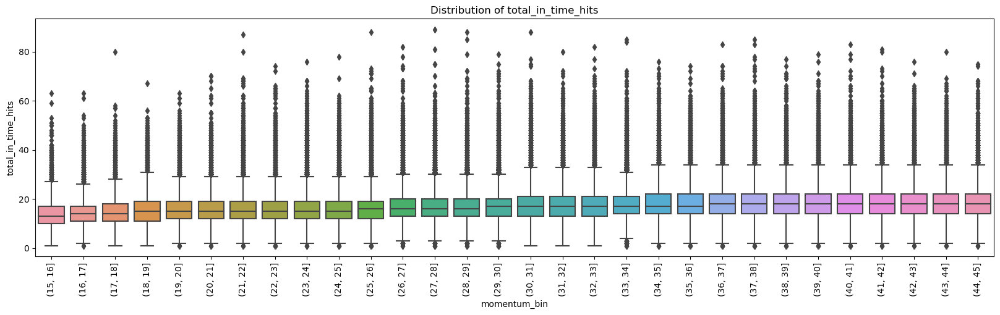

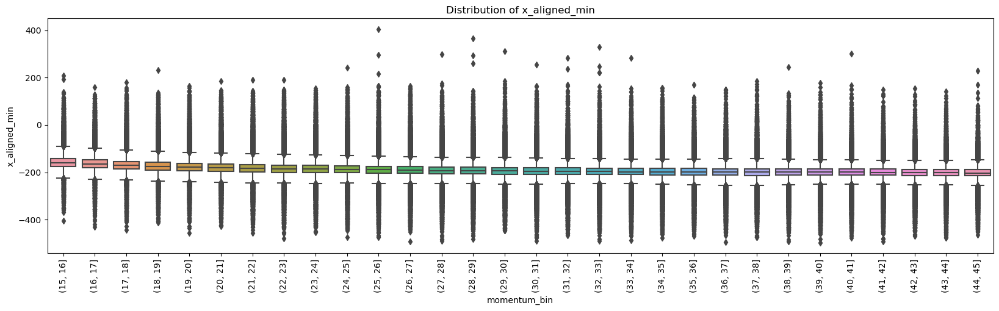

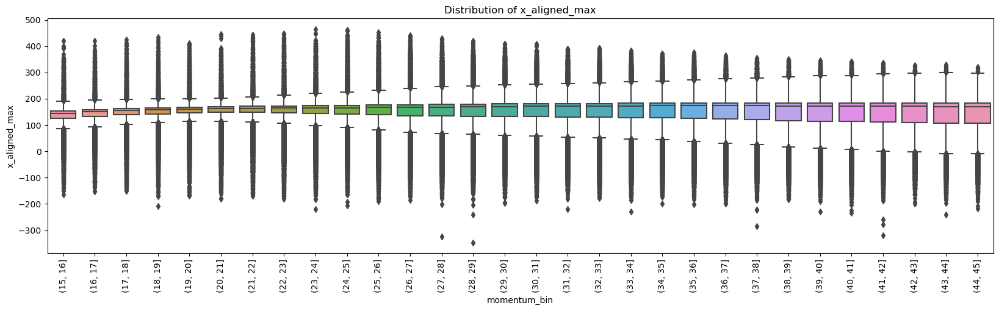

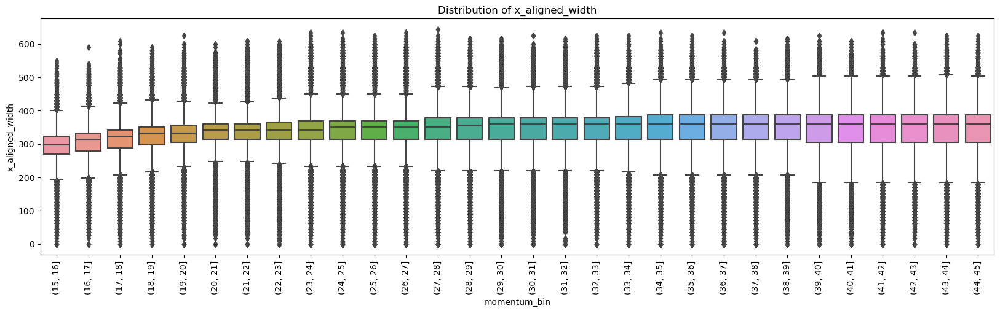

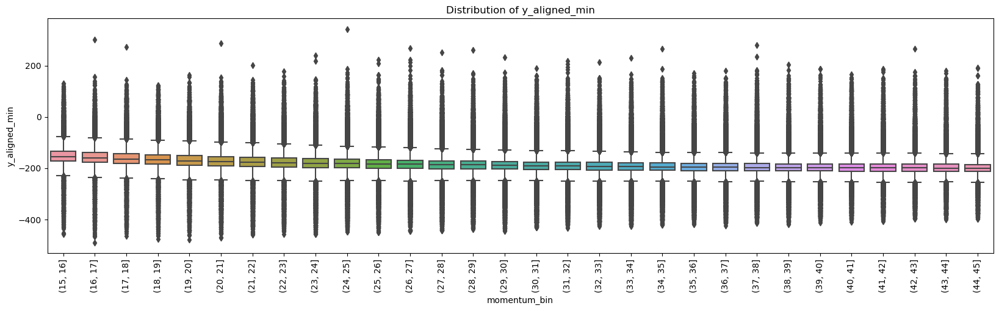

...

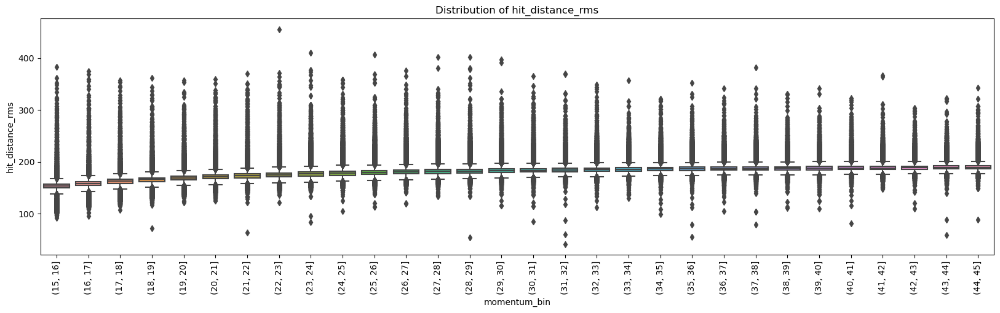

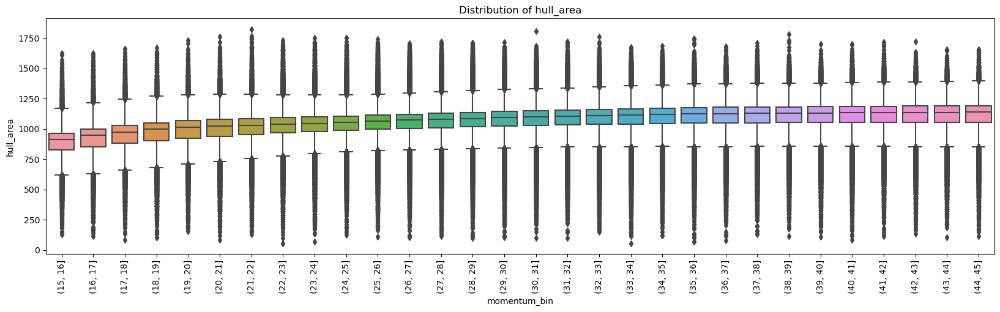

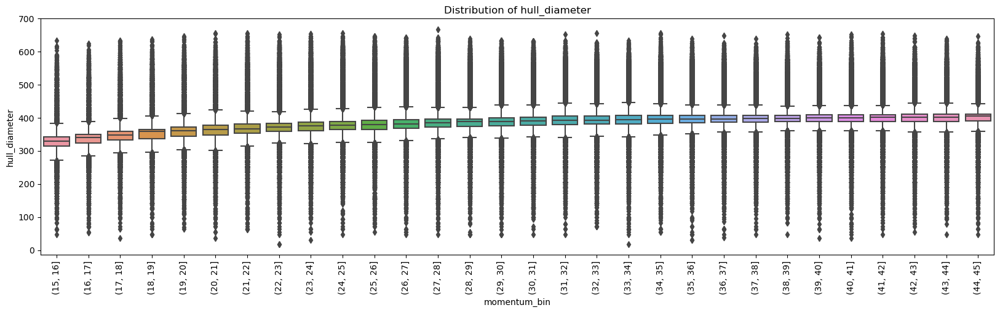

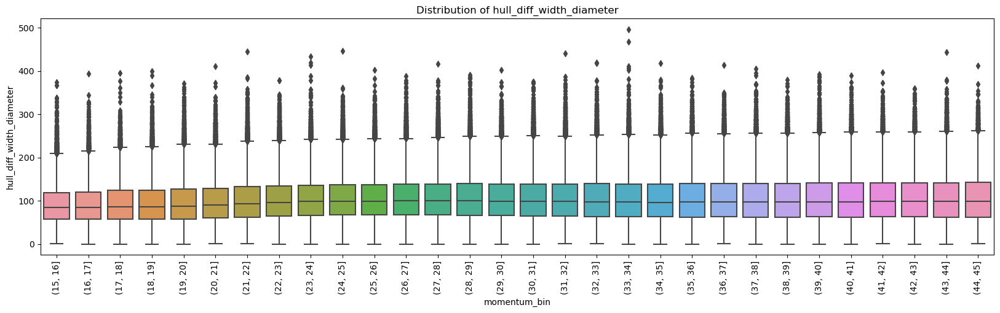

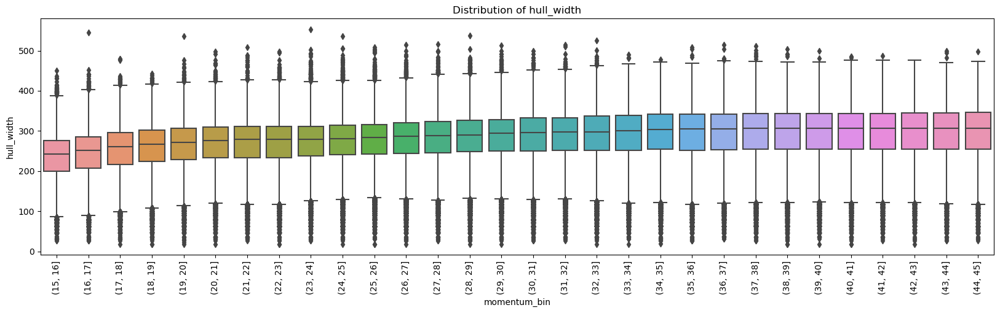

In [11]:
for i in range(1,19):
    sns.boxplot(data = df_selected, x = 'momentum_bin', y = df_selected.columns[i]).set(title = f'Distribution of {df_selected.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()


### 1.2 Boxplots of each feature vs. calculated radius bins 

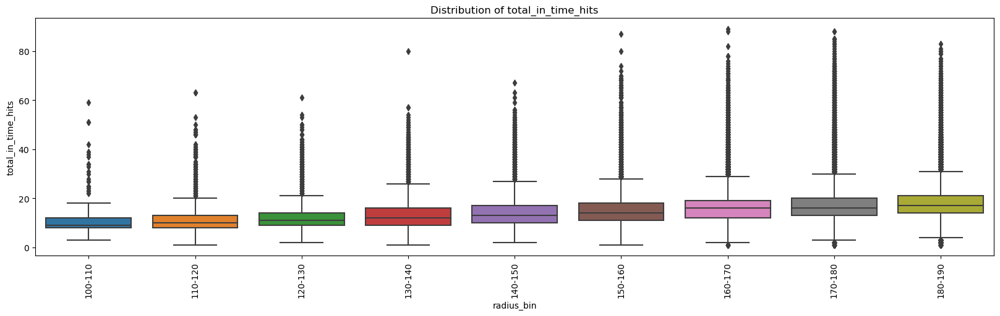

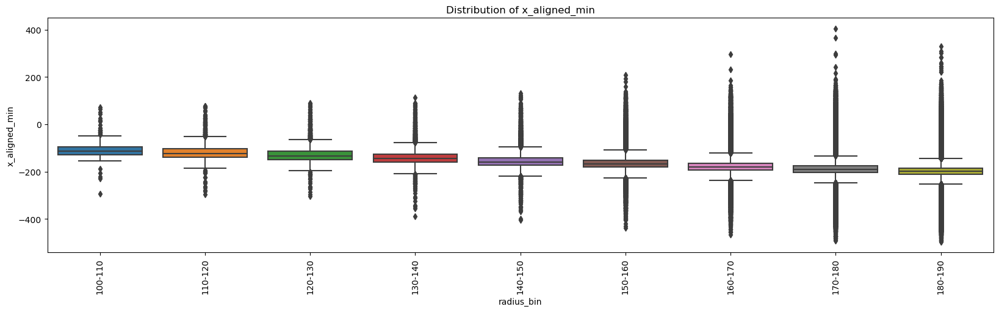

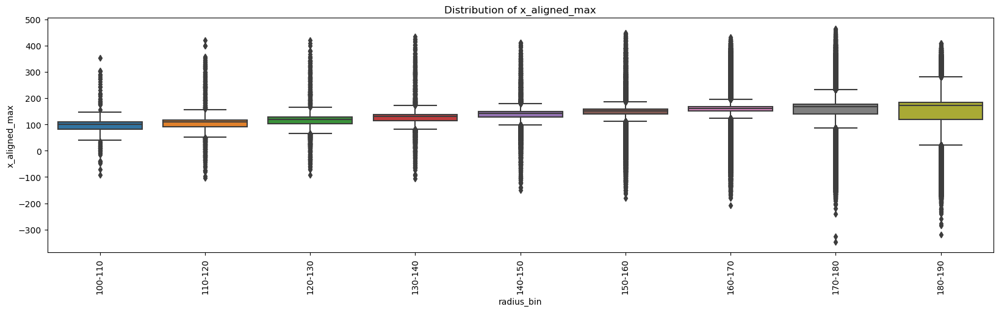

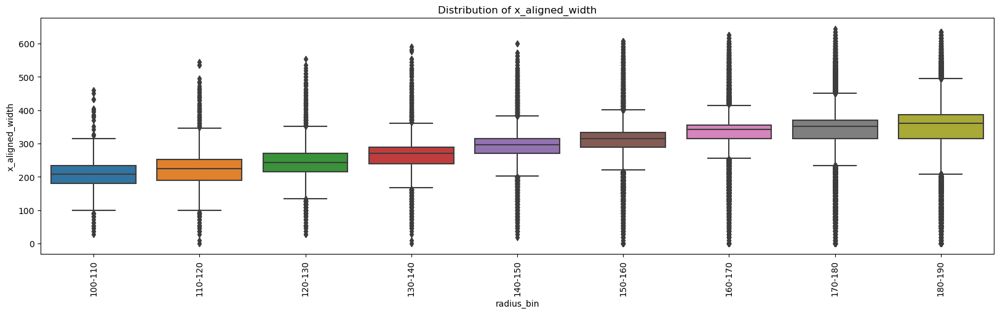

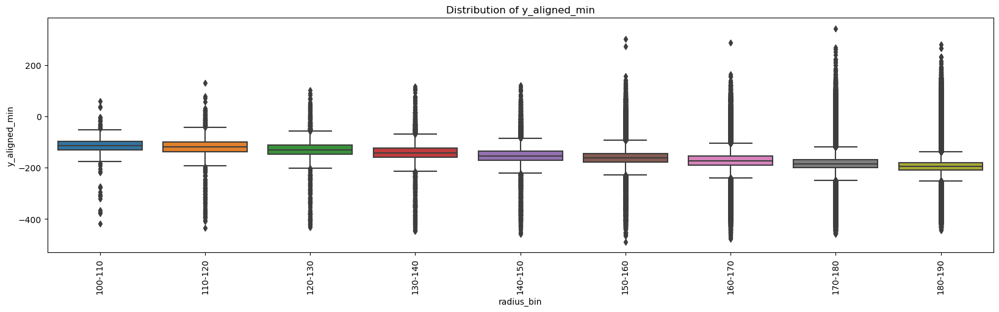

...

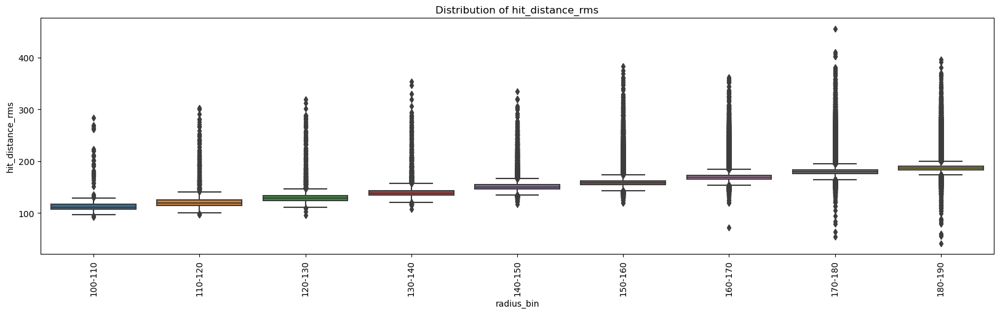

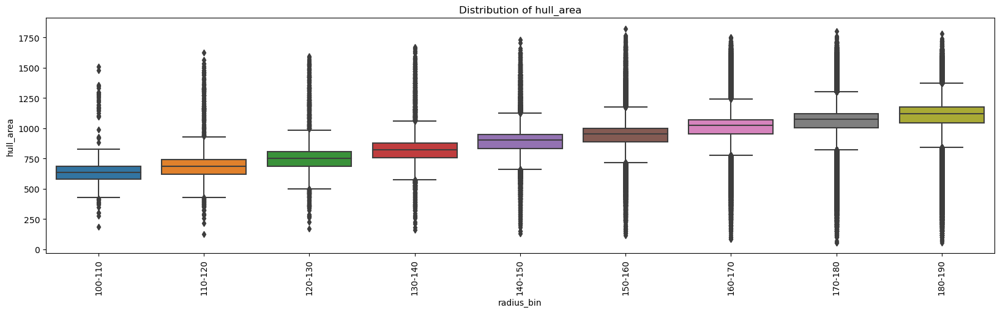

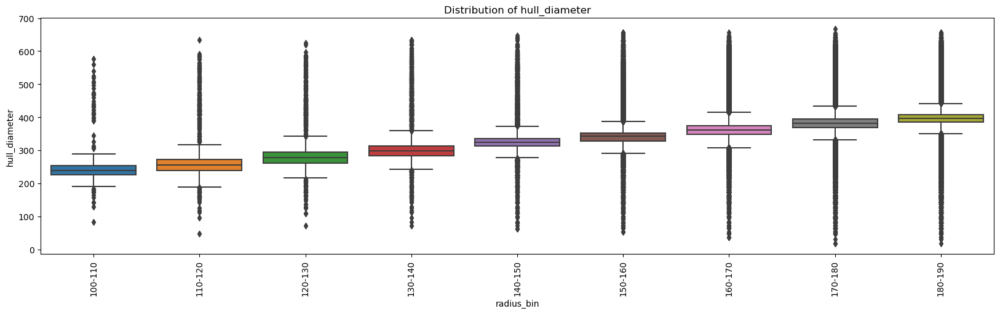

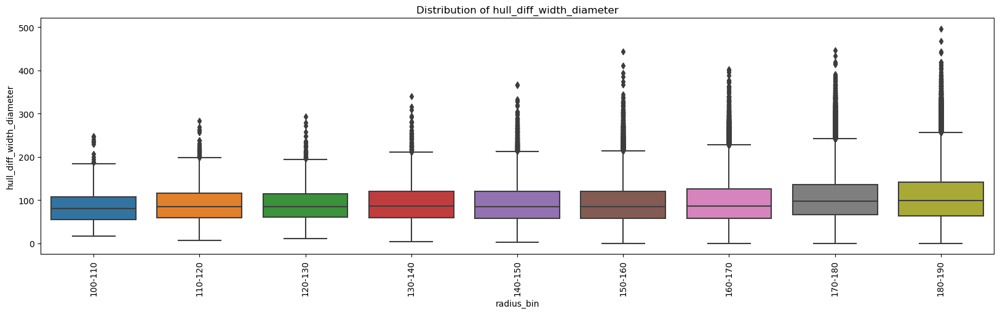

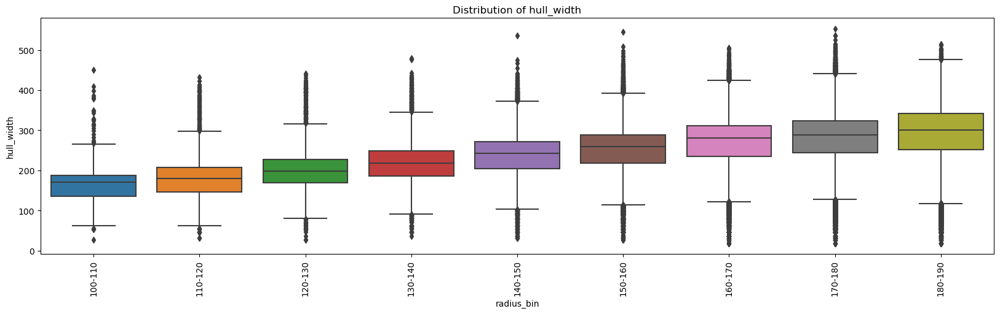

In [12]:
for i in range(1,19):
    sns.boxplot(data = df_selected, x = 'radius_bin', y = df_selected.columns[i]).set(title = f'Distribution of {df_selected.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()

### 1.3 2D histograms showing calculated ring radius vs. all the features with data sliced 

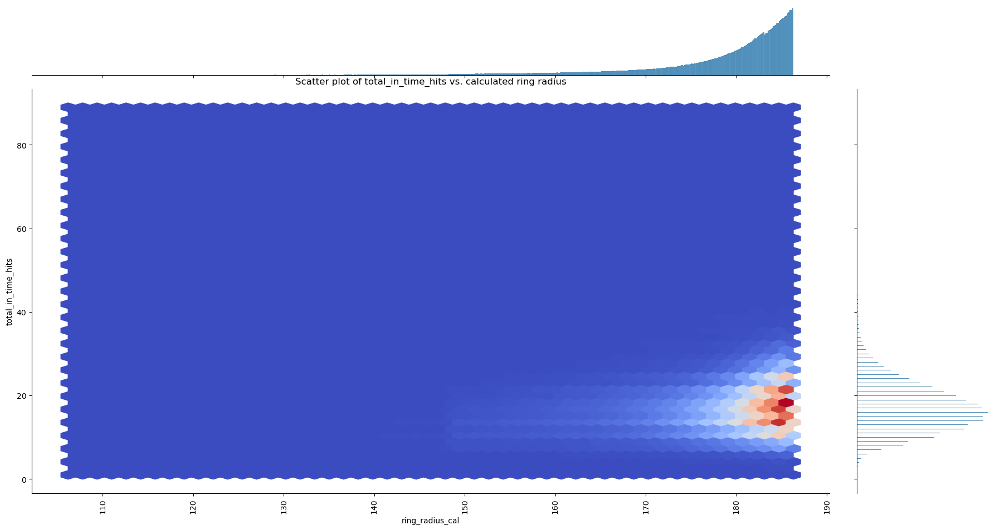

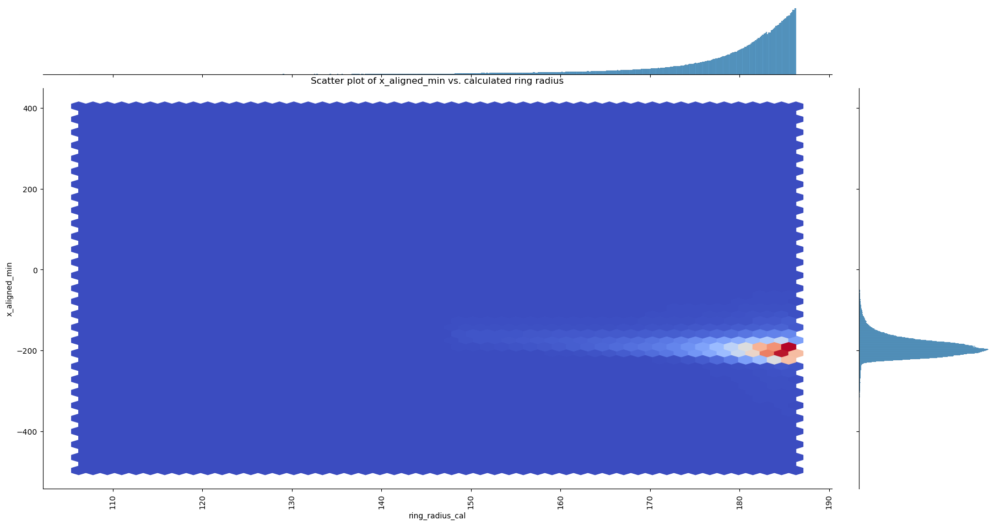

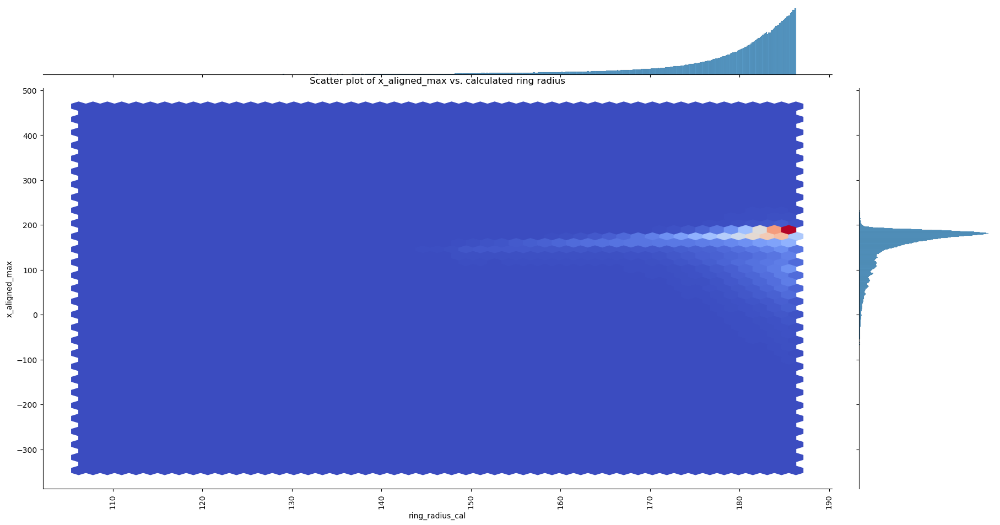

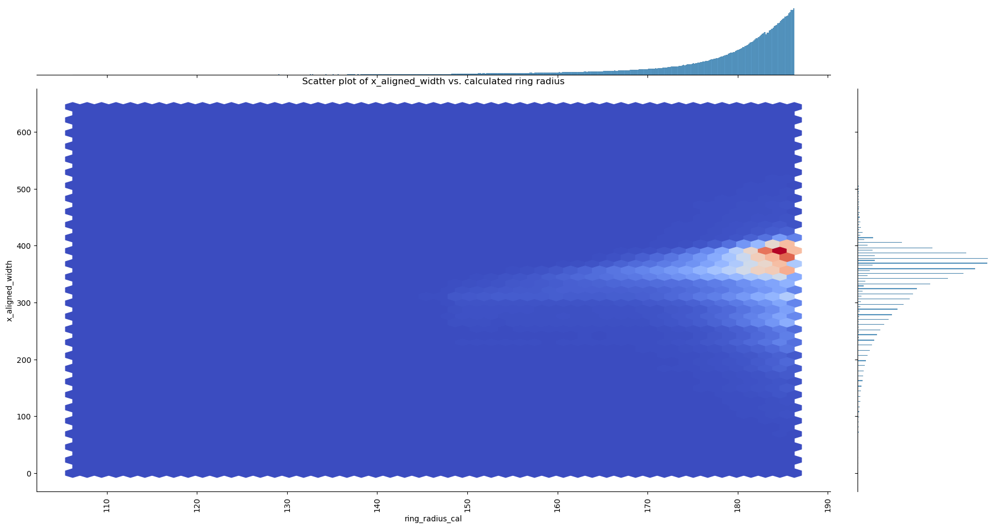

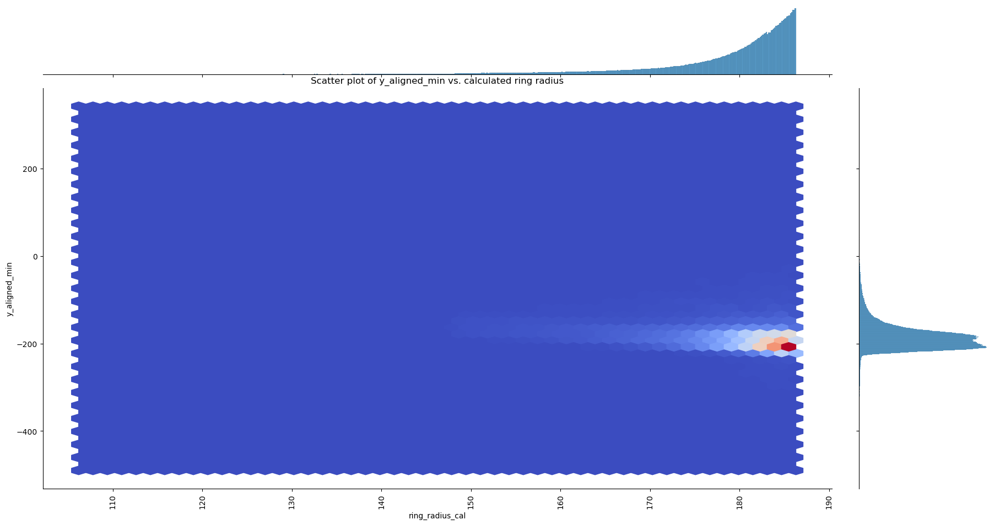

...

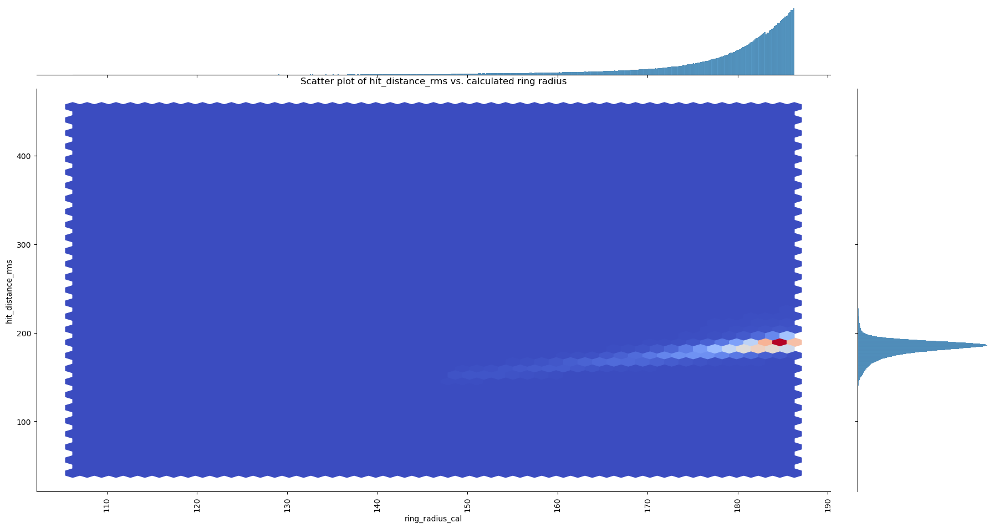

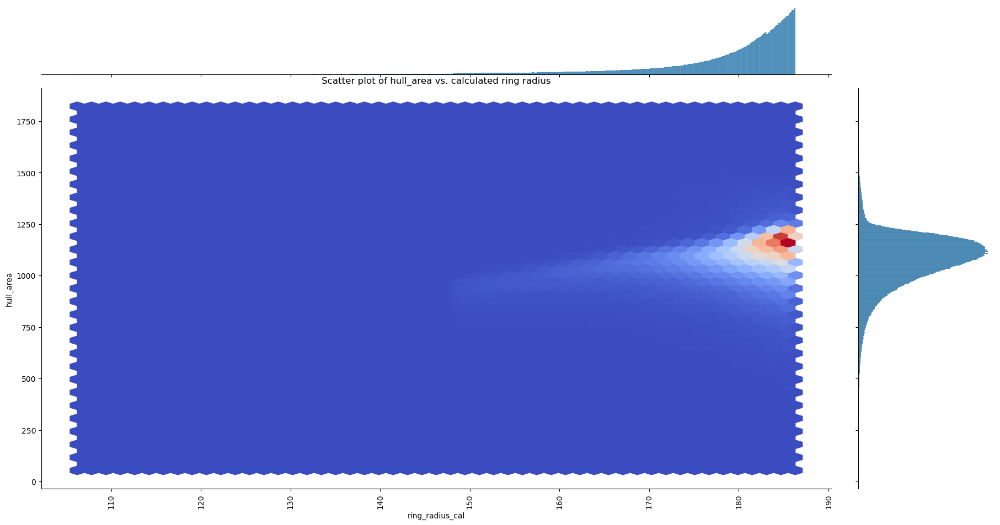

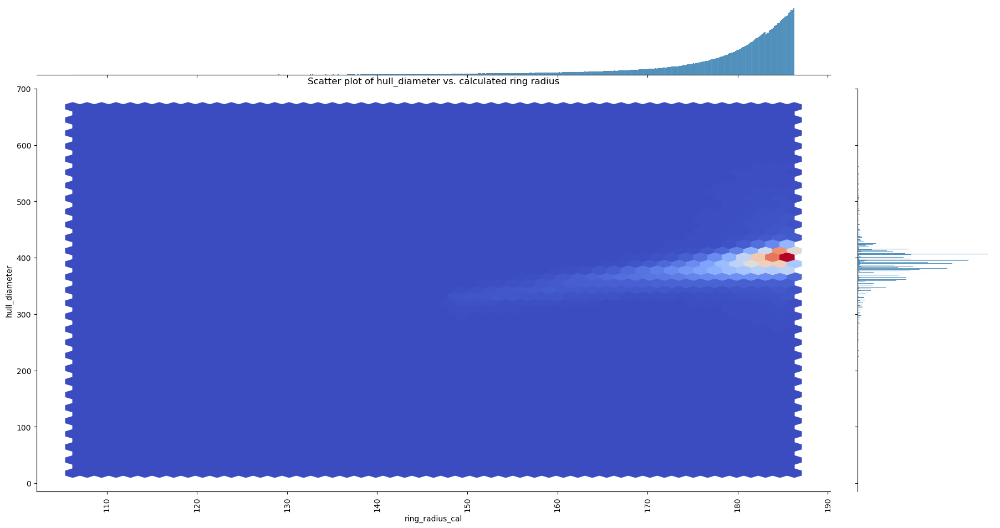

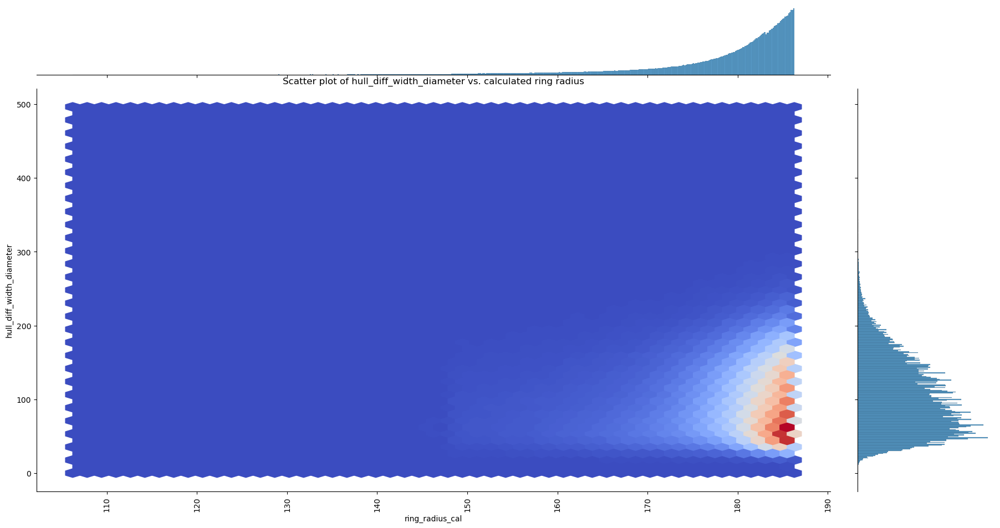

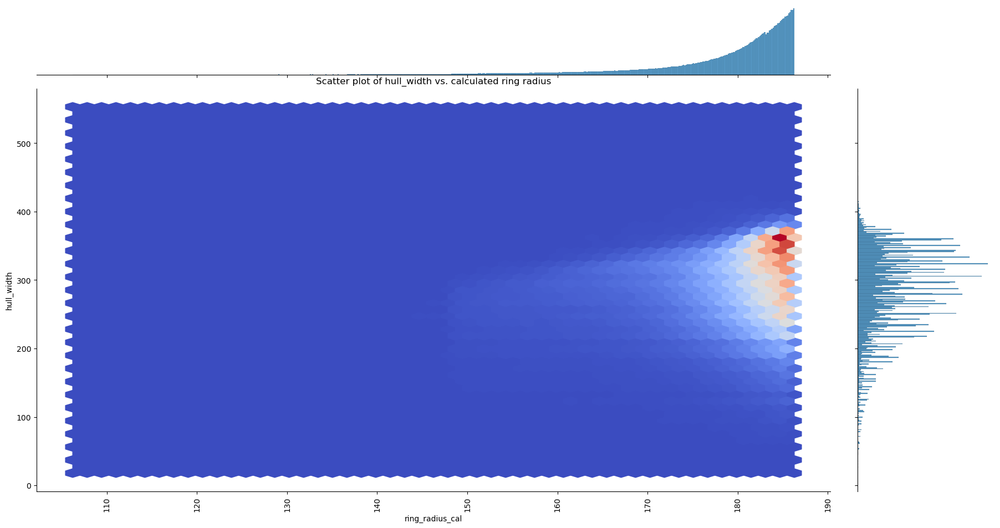

In [13]:
for i in range(1,19):
    g = sns.jointplot(data=df_selected, x = 'ring_radius_cal', y = df_selected.columns[i], kind='hex', cmap='coolwarm')

    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.title(f'Scatter plot of {df_selected.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


### 1.4 Scatter plot showing calculated ring radius vs. all the features

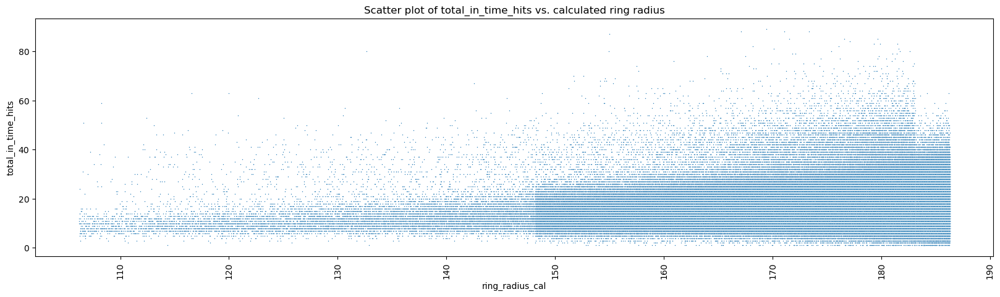

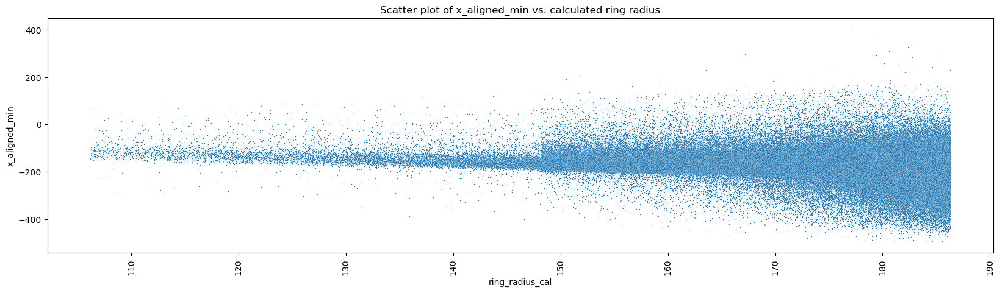

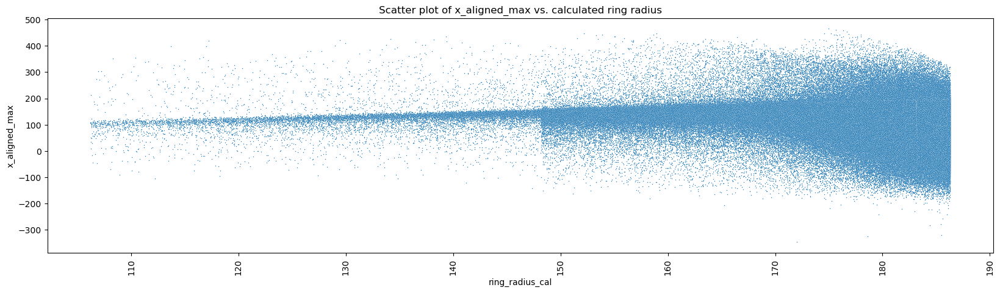

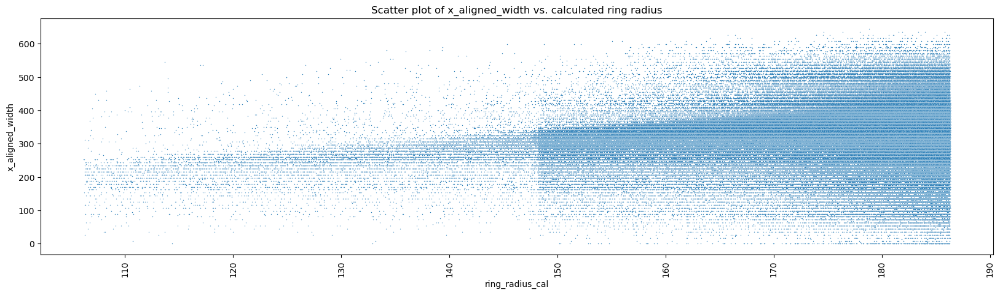

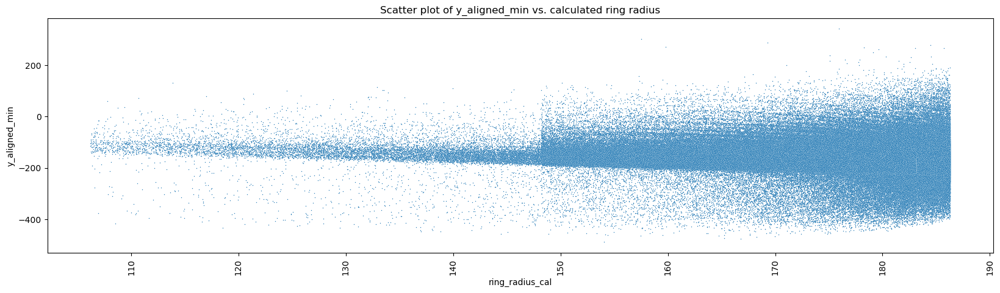

...

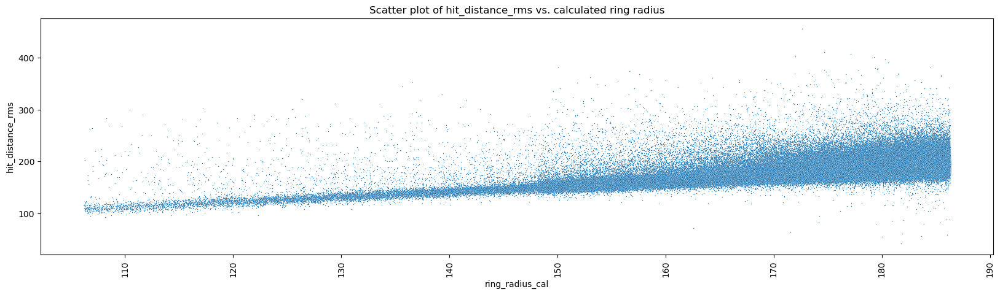

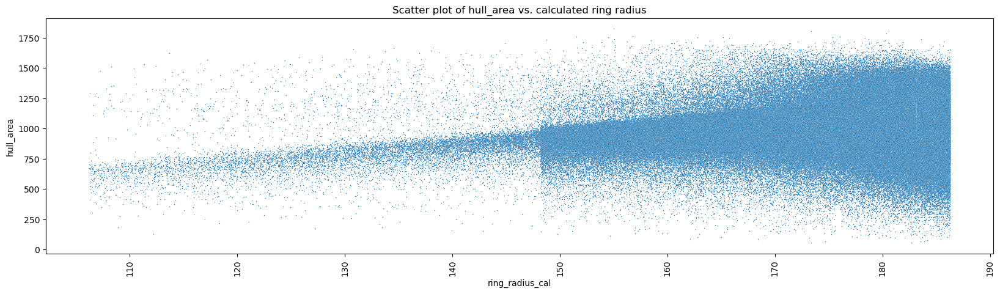

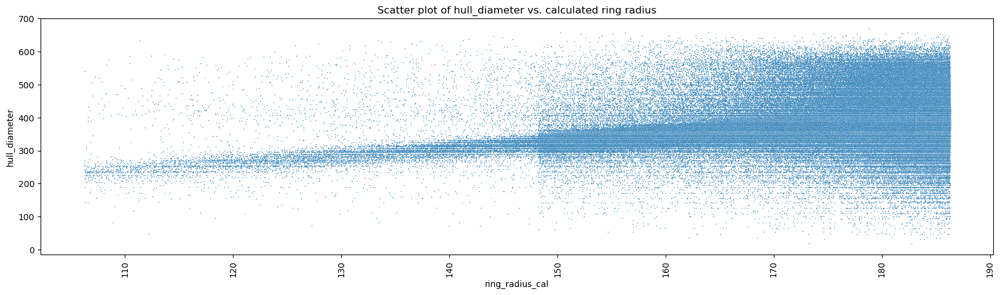

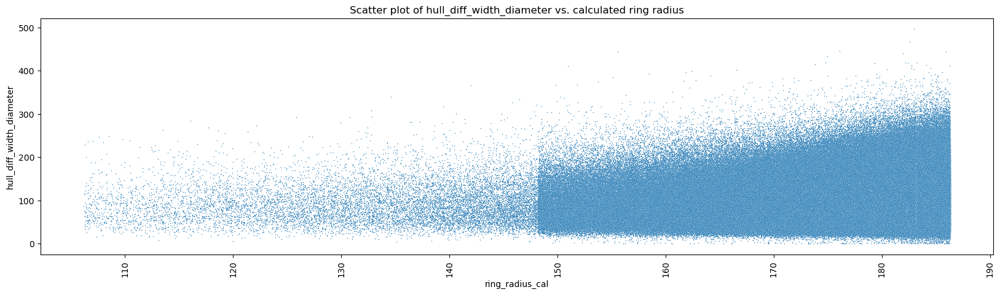

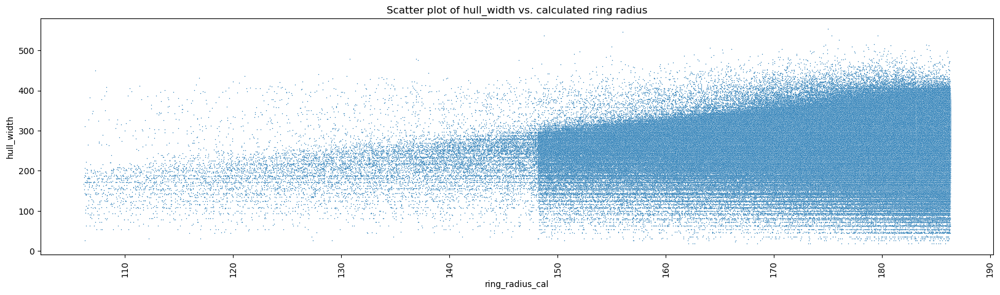

In [14]:
for i in range(1,19):
    g = sns.scatterplot(data = df_selected, x = 'ring_radius_cal', y = df_selected.columns[i], s=1)

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.title(f'Scatter plot of {df_selected.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


## 2. Training

### Train test split

In [15]:
train_df, test_df = train_test_split(df_selected, random_state=42)

In [16]:
X_train = train_df.iloc[:, 1:19]
y_train = train_df['ring_radius_cal']
X_test = test_df.iloc[:, 1:19]
y_test = test_df['ring_radius_cal']

### 2.1 Testing the model with default hyperparameters 

In [17]:
xgb_reg = xgb.XGBRegressor()

In [18]:
reg_metrics = ['neg_root_mean_squared_error', 'r2']

In [19]:
from sklearn.model_selection import cross_val_score, cross_validate, RandomizedSearchCV

### 2.1.1 Fit and scoring

In [20]:
xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [21]:
xgb_reg.score(X_train, y_train)

0.9367885907228123

In [22]:
xgb_reg.score(X_test, y_test)

0.9281717115201964

### 2.1.2 Cross validation

In [23]:
xgb_cv = cross_validate(xgb_reg, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [24]:
pd.DataFrame(xgb_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,49.314230,0.081671,-2.308449,-2.140310,0.928412,0.937766
1,47.909093,0.084121,-2.287668,-2.147243,0.928881,0.937543
2,47.700449,0.080611,-2.307372,-2.145073,0.927871,0.937622
3,48.448549,0.091007,-2.325185,-2.144937,0.926346,0.937716
4,48.524959,0.069154,-2.291123,-2.146415,0.928708,0.937582


### 2.1.3 Plotting feature importance

In [25]:
pd.DataFrame({'features': xgb_reg.feature_names_in_, 'importance': xgb_reg.feature_importances_}).sort_values(by='importance', ascending=False)

,features,importance
10,hit_distance_median,0.871414
12,hit_distance_q75,0.043174
11,hit_distance_q25,0.019920
5,y_aligned_max,0.009985
2,x_aligned_max,0.006330
9,hit_distance_mean,0.006112
15,hull_diameter,0.005054
8,hit_distance_max,0.004737
13,hit_distance_rms,0.004425
16,hull_diff_width_diameter,0.004314


### 2.1.4 Computing residuals

In [26]:
ypred = xgb_reg.predict(X_test)

In [27]:
pred_df = pd.DataFrame(ypred, y_test).reset_index()
pred_df.columns=['theoretical_radius', 'predicted_radius']

In [28]:
pred_df

,theoretical_radius,predicted_radius
0,185.233780,185.225342
1,183.981461,184.199066
2,180.477921,183.752274
3,180.616638,179.365112
4,174.728119,177.717392
...,...,...
422099,181.969681,184.592499
422100,175.965973,179.781876
422101,178.391876,172.657013
422102,176.369583,176.369598


In [29]:
pred_df['residual'] = pred_df['theoretical_radius'] - pred_df['predicted_radius']

Text(0, 0.5, 'Residuals')

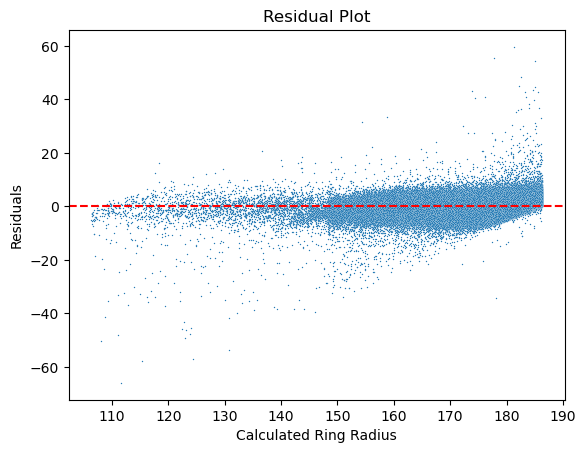

In [30]:
sns.scatterplot(data=pred_df, x='theoretical_radius', y='residual', s=1)

plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(37.597222222222214, 0.5, 'Residuals')

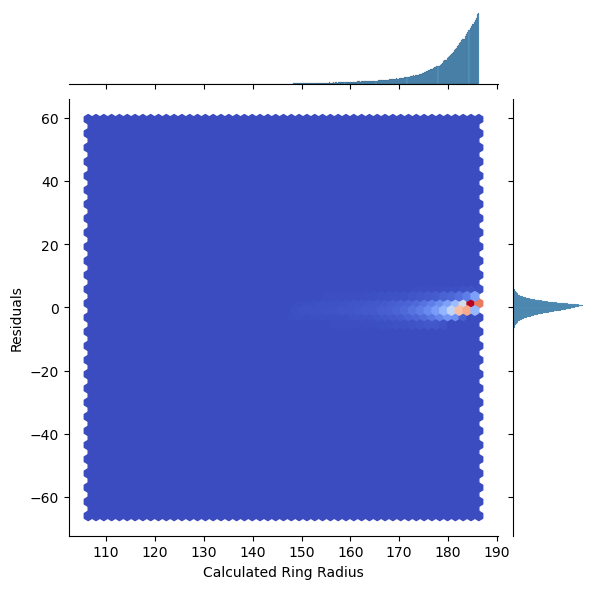

In [31]:
g = sns.jointplot(data=pred_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm')

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 2.2 Hyperparameter optimization

#### Subsetting a smaller sample for hyperparameter optimization

In [32]:
# samples_per_bin = 3000

# sampled_group = df_selected.groupby('momentum_bin').apply(lambda x: x.sample(samples_per_bin, random_state=42)).reset_index(drop=True)

# sampled_group.reset_index(drop=True, inplace=True)


In [33]:
# train_df_subset, test_df_subset = train_test_split(sampled_group, random_state=42)

In [34]:
# X_train_subset = train_df_subset.iloc[:, 1:19]
# y_train_subset = train_df_subset['ring_radius_cal']
# X_test_subset = test_df_subset.iloc[:, 1:19]
# y_test_subset = test_df_subset['ring_radius_cal']

#### Hyperparameters included:
- `max_depth`: the maximum depth of trees 
- `learning_rate`: the rate at which each new tree modifies the overall model
- `reg_lambda`: the degree of L2 regularization
- `reg_alpha`: the degree of L1 regularization 
- `n_estimators`: number of trees included in the model 

In [35]:
# param_grid = {
#     "max_depth": [4, 6, 8, 10],
#     "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7],
#     "reg_lambda": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
#     "reg_alpha": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
#     "n_estimators": [100, 300, 500, 700, 900]
# }

# xgb_tune = XGBRegressor()

# random_search = RandomizedSearchCV(
#     estimator=xgb_tune,
#     param_distributions=param_grid,
#     scoring="r2",
#     n_iter=20,
#     cv=5,
#     random_state=42
# )

# random_search.fit(X_train_subset, y_train_subset)

In [36]:
# best_params = random_search.best_params_
# best_score = random_search.best_score_

In [37]:
# best_params

In [38]:
# best_score

#### 2.2.1 Showing cv scores on the optimized hyperparameters

In [39]:
xgb_opt = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1)

In [40]:
# xgb_opt_cv = cross_validate(xgb_opt, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [42]:
# pd.DataFrame(xgb_opt_cv)

#### 2.2.2 Fitting the model with the optimized hyperparameters 

In [43]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 2.2.3 Plotting feature importance

In [44]:
importance = pd.DataFrame({'features': xgb_opt.feature_names_in_, 'importance': xgb_opt.feature_importances_})

In [45]:
importance.sort_values(by='importance', ascending=False)

,features,importance
10,hit_distance_median,0.872893
12,hit_distance_q75,0.041774
11,hit_distance_q25,0.018666
5,y_aligned_max,0.009985
13,hit_distance_rms,0.008105
9,hit_distance_mean,0.006167
2,x_aligned_max,0.005680
15,hull_diameter,0.004729
8,hit_distance_max,0.004454
16,hull_diff_width_diameter,0.004396


#### 2.2.4 Computing the residuals 

In [46]:
ypred_opt = xgb_opt.predict(X_test)

In [47]:
pred_opt_df = pd.DataFrame(ypred_opt, y_test).reset_index()
pred_opt_df.columns=['theoretical_radius', 'predicted_radius']
pred_opt_df['residual'] = pred_opt_df['theoretical_radius'] - pred_opt_df['predicted_radius']

Text(0, 0.5, 'Residuals')

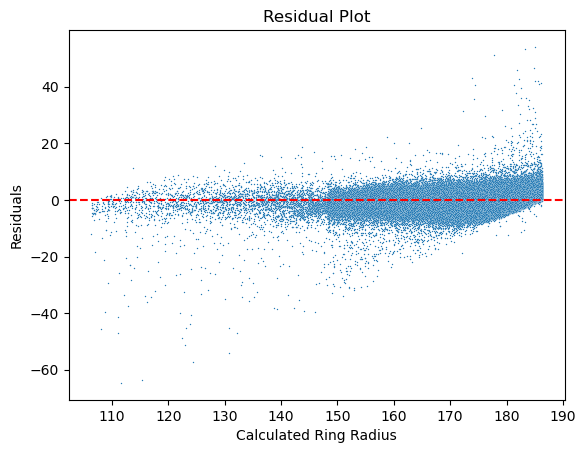

In [48]:
sns.scatterplot(data=pred_opt_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

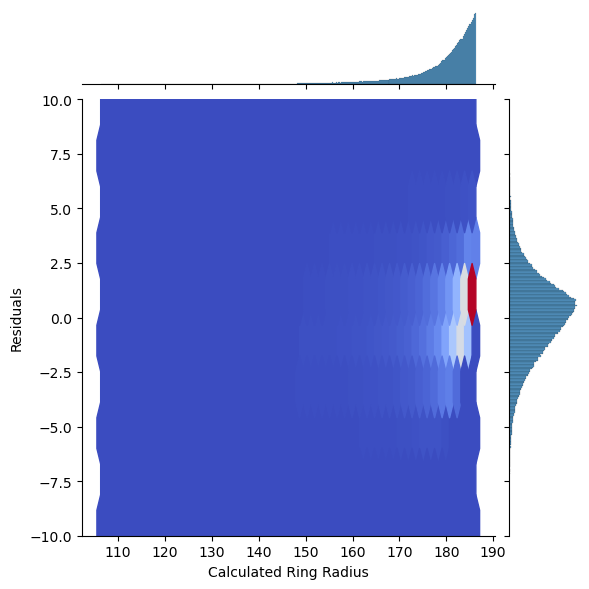

In [49]:
g = sns.jointplot(data=pred_opt_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 2.3 Comparing the residual plot with ring radius calculated with SOTA 

#### 2.3.1 Computing the residuals

In [50]:
res_comp = df_selected[['ring_radius_cal', 'ring_radius']]

In [51]:
res_comp['radius_pred'] = xgb_opt.predict(df_selected.iloc[:, 1:19])

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/1629711860.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  res_comp['radius_pred'] = xgb_opt.predict(df_selected.iloc[:, 1:19])


In [52]:
res_comp['res_model'] = res_comp['ring_radius_cal'] - res_comp['radius_pred']
res_comp['res_sota'] = res_comp['ring_radius_cal'] - res_comp['ring_radius']

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/4182022239.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  res_comp['res_model'] = res_comp['ring_radius_cal'] - res_comp['radius_pred']
/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/4182022239.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  res_comp['res_sota'] = res_comp['ring_radius_cal'] - res_comp['ring_radius']


In [53]:
res_comp

,ring_radius_cal,ring_radius,radius_pred,res_model,res_sota
0,173.410156,172.410950,172.004959,1.405197,0.999207
1,174.660522,175.251694,174.338989,0.321533,-0.591171
2,155.299332,155.040802,152.350540,2.948792,0.258530
3,184.035400,185.832642,183.384552,0.650848,-1.797241
4,156.473602,158.641846,162.813446,-6.339844,-2.168243
...,...,...,...,...,...
2376022,174.585281,175.371704,174.253159,0.332123,-0.786423
2376023,176.125702,178.343094,181.269516,-5.143814,-2.217392
2376024,148.410736,148.395798,150.345505,-1.934769,0.014938
2376025,172.438187,175.335617,171.211823,1.226364,-2.897430


#### 2.3.2 Plotting residual from SOTA vs. residual from our model

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/2230124719.py:7: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[0]._sizes = [100]
/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_39530/2230124719.py:8: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[1]._sizes = [100]


Text(0, 0.5, 'Residuals')

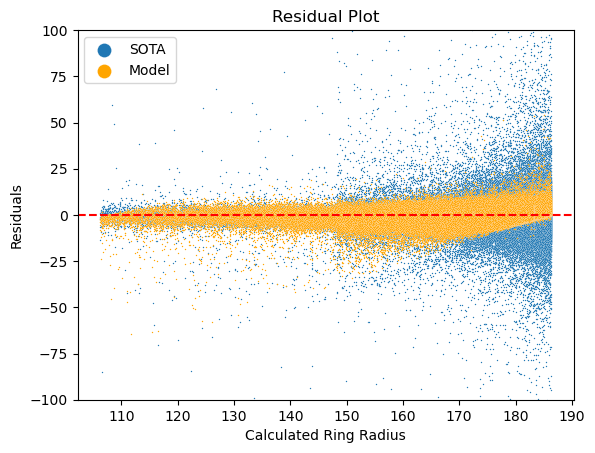

In [63]:
g = sns.scatterplot(data=res_comp, x='ring_radius_cal', y='res_sota', s=1, label='SOTA')
g = sns.scatterplot(data=res_comp, x='ring_radius_cal', y='res_model', color = 'orange', s=1, label='Model')
plt.axhline(y=0, color='red', linestyle='--')
g.set(ylim = (-100, 100))

legend = plt.legend()
legend.legendHandles[0]._sizes = [100]  
legend.legendHandles[1]._sizes = [100] 
plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 2.4 Plotting the `hit_distance_median` vs. calculated ring radius and momentum

#### 2.4.1 Plotting hit_distance_median` vs. calculated ring radius

<Axes: xlabel='ring_radius_cal', ylabel='hit_distance_median'>

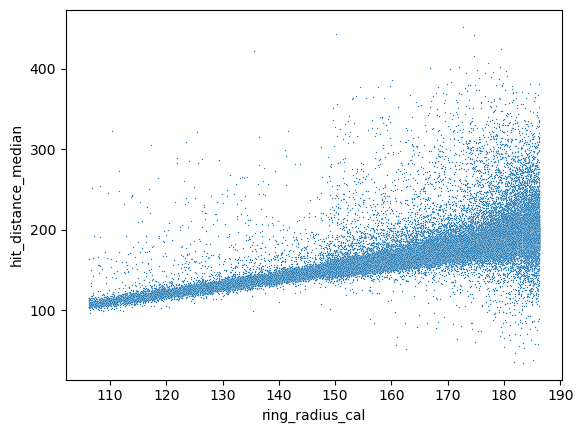

In [55]:
sns.scatterplot(data = df_selected, x = 'ring_radius_cal', y = 'hit_distance_median', s=1)

Text(37.597222222222214, 0.5, 'Median hit radius')

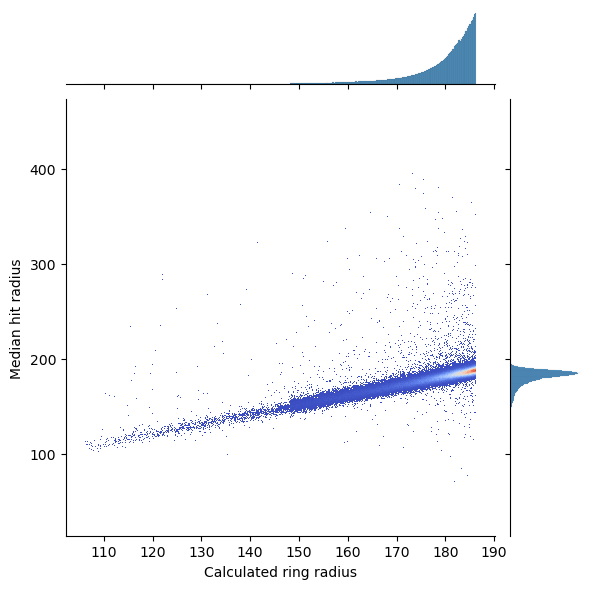

In [56]:
g = sns.jointplot(data = df_selected, x = 'ring_radius_cal', y = 'hit_distance_median', kind='hist', cmap='coolwarm')

plt.xlabel('Calculated ring radius')
plt.ylabel('Median hit radius')

#### 2.4.2 Plotting `hit_distance_median` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red 

<Axes: xlabel='track_momentum', ylabel='hit_distance_median'>

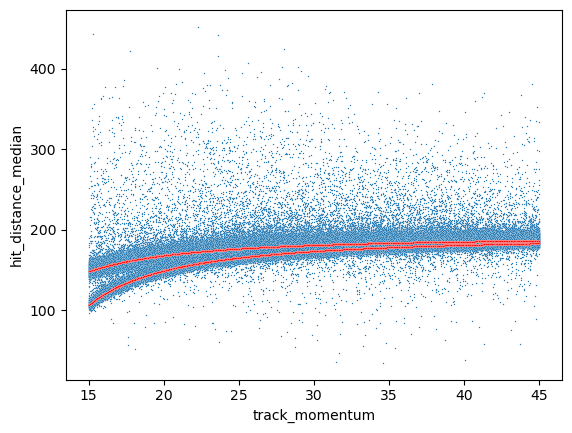

In [57]:
sns.scatterplot(data = df_selected, x = 'track_momentum', y = 'hit_distance_median', s=1)
sns.scatterplot(data = df_selected, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)

### 2.5 Plotting the distribution of residuals in radius bins 

#### 2.5.1 Cutting the theoretical radius into 5 bins 

In [58]:
num_bins = 5
bin_edges = np.histogram_bin_edges(pred_df['theoretical_radius'], bins=num_bins)

In [59]:
pred_df['radius_bin'] = pd.cut(pred_df['theoretical_radius'], bins=bin_edges)

#### 2.5.2 Plotting the distribution of residuals 
- A density curve is used to show the distribution
- The 2.5% and 97.5% percentile bounds are labelled on each curve (covers 95% of the distribution)

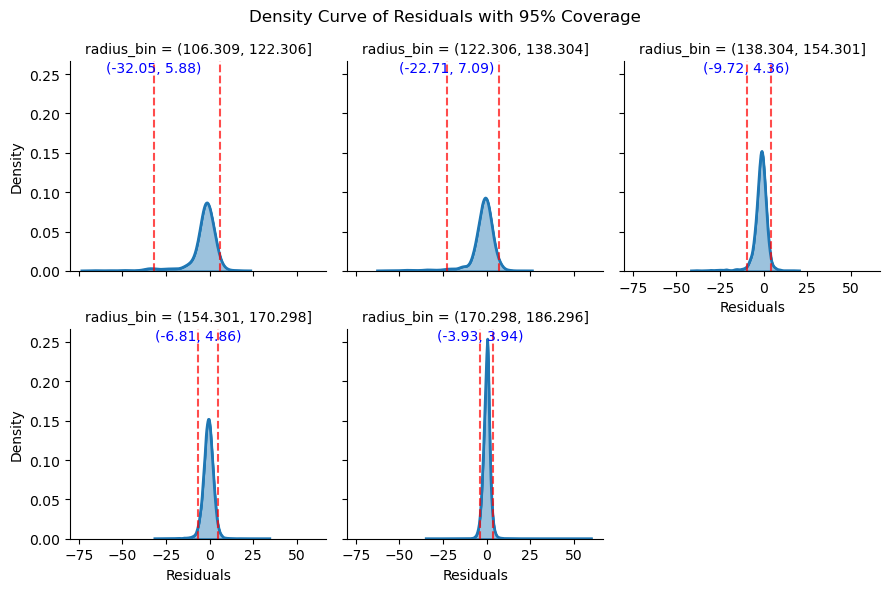

In [60]:
from scipy.stats import scoreatpercentile

g = sns.FacetGrid(pred_df, col='radius_bin', col_wrap=3)
g.map(sns.kdeplot, 'residual', fill=True)
g.map(sns.kdeplot, 'residual', lw=1)

def plot_density_curve(data, **kwargs):
    ax = plt.gca()
    p2_5 = scoreatpercentile(data, 2.5)
    p97_5 = scoreatpercentile(data, 97.5)
    
    sns.kdeplot(data, fill=True, ax=ax, **kwargs)
    sns.kdeplot(data, lw=2, ax=ax, **kwargs)
    ax.axvline(p2_5, color='red', linestyle='--', alpha=0.7, label='2.5% percentile')
    ax.axvline(p97_5, color='red', linestyle='--', alpha=0.7, label='97.5% percentile')
    ax.legend()
    ax.set_ylabel('Density')
    ax.text(p2_5, ax.get_ylim()[1], f'({p2_5:.2f}, {p97_5:.2f})', color='blue', va='top', ha='center')

g.map(plot_density_curve, 'residual')

g.set_axis_labels('Residuals', 'Density')

g.fig.suptitle('Density Curve of Residuals with 95% Coverage')

plt.tight_layout()

plt.show()

### 2.6 Correlation heatmap between features 

In [61]:
corr_df = df_selected.iloc[:, 1:19]

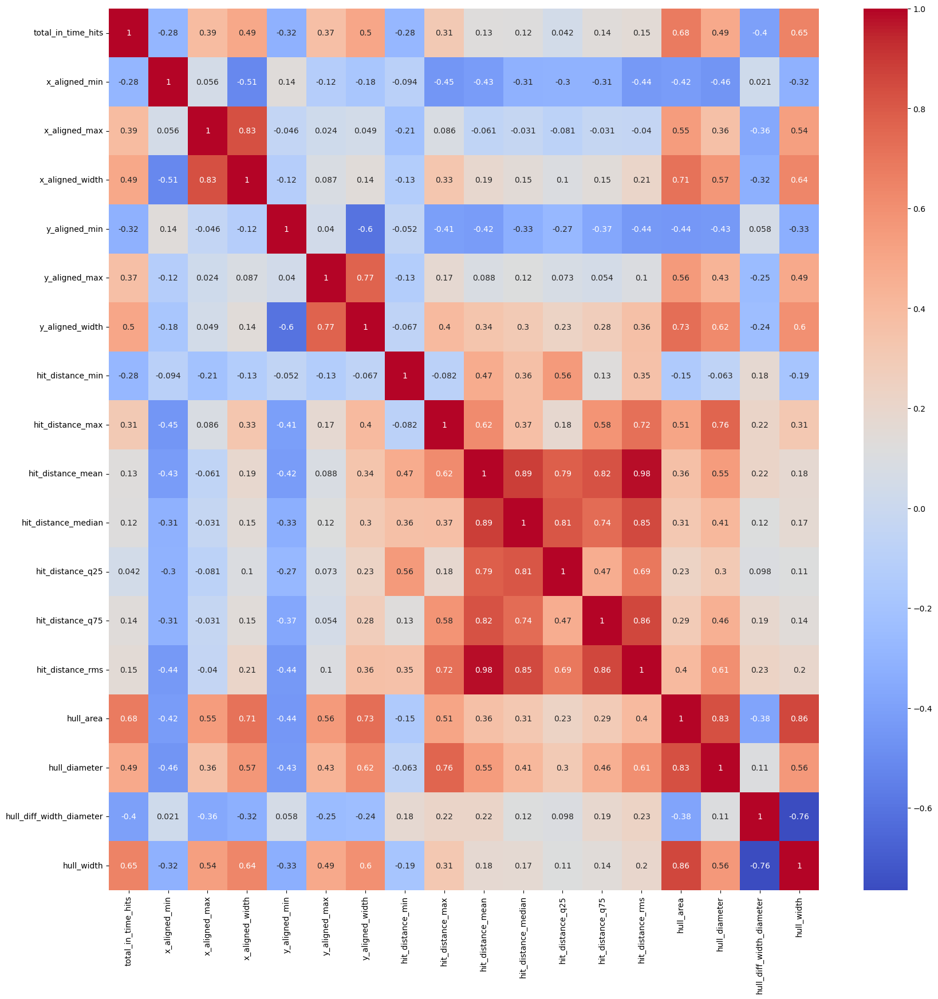

In [62]:
correlation_matrix = corr_df.corr()

plt.figure(figsize=(20, 20)) 

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.show()